## Analysis

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder

from sklearn.linear_model import LinearRegression

from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error

pd.set_option('display.max_columns', None)

In [2]:
df = pd.read_csv('.\\diamonds.csv')
df

,diamond_id,shape,size,color,fancy_color_dominant_color,fancy_color_secondary_color,fancy_color_overtone,fancy_color_intensity,clarity,cut,symmetry,polish,depth_percent,table_percent,meas_length,meas_width,meas_depth,girdle_min,girdle_max,culet_size,culet_condition,fluor_color,fluor_intensity,lab,total_sales_price,eye_clean,date
0,131328926,Round,0.09,E,NaN,NaN,NaN,NaN,VVS2,Excellent,Very Good,Very Good,62.7,59.0,2.85,2.87,1.79,M,M,N,NaN,NaN,None,IGI,200,NaN,2022-02-24
1,131704776,Round,0.09,E,NaN,NaN,NaN,NaN,VVS2,Very Good,Very Good,Very Good,61.9,59.0,2.84,2.89,1.78,STK,STK,N,NaN,NaN,None,IGI,200,NaN,2022-02-24
2,131584417,Round,0.09,E,NaN,NaN,NaN,NaN,VVS2,Excellent,Very Good,Very Good,61.1,59.0,2.88,2.90,1.77,TN,M,NaN,NaN,NaN,None,IGI,200,NaN,2022-02-24
3,131584416,Round,0.09,E,NaN,NaN,NaN,NaN,VVS2,Excellent,Very Good,Very Good,62.0,59.0,2.86,2.88,1.78,M,STK,NaN,NaN,NaN,None,IGI,200,NaN,2022-02-24
4,131613644,Round,0.09,E,NaN,NaN,NaN,NaN,VVS2,Very Good,Very Good,Excellent,64.9,58.5,2.79,2.83,1.82,STK,STK,N,NaN,NaN,None,IGI,200,NaN,2022-02-24
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219699,135619262,Round,10.65,E,NaN,NaN,NaN,NaN,VS1,Excellent,Excellent,Excellent,61.3,58.0,14.06,14.18,8.66,M,STK,N,NaN,NaN,None,GIA,1210692,NaN,2022-02-24
219700,135122237,Radiant,5.17,NaN,Green,NaN,None,Fancy Light,VS2,NaN,Very Good,Very Good,64.8,65.0,11.55,8.81,5.71,TK,XTK,NaN,NaN,NaN,None,GIA,1292500,NaN,2022-02-24
219701,135553116,Round,18.07,E,NaN,NaN,NaN,NaN,VS1,Excellent,Excellent,Excellent,60.2,59.0,17.06,17.10,10.20,TN,M,N,NaN,NaN,None,GIA,1315496,NaN,2022-02-24
219702,114752541,Princess,0.90,NaN,Red,NaN,NaN,Fancy,SI2,NaN,Good,Good,70.8,72.0,5.22,4.90,3.47,XTN,VTK,N,NaN,NaN,Faint,GIA,1350000,NaN,2022-02-24


In [3]:
df.describe()

,diamond_id,size,depth_percent,table_percent,meas_length,meas_width,meas_depth,total_sales_price
count,2.197040e+05,219704.000000,219704.000000,219704.000000,219704.000000,219704.000000,219704.000000,2.197040e+05
mean,1.281166e+08,0.755176,61.683794,57.747579,5.548867,5.135623,3.285698,6.908035e+03
std,1.320737e+07,0.845892,9.915251,9.959906,1.763932,1.374527,2.054817,2.595944e+04
min,9.666855e+06,0.080000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000e+02
25%,1.275641e+08,0.310000,61.200000,57.000000,4.350000,4.310000,2.680000,9.580000e+02
50%,1.326076e+08,0.500000,62.400000,58.000000,5.060000,4.800000,3.030000,1.970000e+03
75%,1.348523e+08,1.000000,63.500000,60.000000,6.350000,5.700000,3.630000,5.207000e+03
max,1.361475e+08,19.350000,98.700000,94.000000,93.660000,62.300000,76.300000,1.449881e+06


In [4]:
df.describe(include=[object])

,shape,color,fancy_color_dominant_color,fancy_color_secondary_color,fancy_color_overtone,fancy_color_intensity,clarity,cut,symmetry,polish,girdle_min,girdle_max,culet_size,culet_condition,fluor_color,fluor_intensity,lab,eye_clean,date
count,219704,210542,9164,1062,2038,9162,219704,159097,219704,219704,136271,135408,133963,15319,15726,219576,219704,62787,219704
unique,11,10,12,10,8,9,11,6,5,5,9,9,8,3,5,7,3,4,1
top,Round,E,Yellow,Brown,None,Fancy,SI1,Excellent,Excellent,Excellent,M,STK,N,Pointed,Blue,None,GIA,Yes,2022-02-24
freq,158316,33103,6487,306,1650,3447,38628,124861,131619,175806,74421,70440,131899,15293,15219,143491,200434,61931,219704


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 219704 entries, 0 to 219703
Data columns (total 27 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   diamond_id                   219704 non-null  int64  
 1   shape                        219704 non-null  object 
 2   size                         219704 non-null  float64
 3   color                        210542 non-null  object 
 4   fancy_color_dominant_color   9164 non-null    object 
 5   fancy_color_secondary_color  1062 non-null    object 
 6   fancy_color_overtone         2038 non-null    object 
 7   fancy_color_intensity        9162 non-null    object 
 8   clarity                      219704 non-null  object 
 9   cut                          159097 non-null  object 
 10  symmetry                     219704 non-null  object 
 11  polish                       219704 non-null  object 
 12  depth_percent                219704 non-null  float64
 13 

In [6]:
for col in df:
  unq_vals = df[col].unique()
  num_unq_vals = len(unq_vals)
  
  if num_unq_vals < 12:
    print(f'{col:17} | {df[col].dtype} | {num_unq_vals:5} | {unq_vals}')
  else:
    print(f'{col:17} | {df[col].dtype} | {num_unq_vals:5} |')

diamond_id        | int64 | 219704 |
shape             | object |    11 | ['Round' 'Pear' 'Oval' 'Marquise' 'Princess' 'Emerald' 'Heart' 'Cushion'
 'Radiant' 'Cushion Modified' 'Asscher']
size              | float64 |   878 |
color             | object |    11 | ['E' 'F' 'L' 'D' 'J' 'I' 'G' 'H' 'M' 'K' nan]
fancy_color_dominant_color | object |    13 |
fancy_color_secondary_color | object |    11 | [nan 'Purple' 'Green' 'Yellow' 'Brown' 'Orange' 'Pink' 'Gray' 'Blue'
 'Violet' 'Red']
fancy_color_overtone | object |     9 | [nan 'None' 'Yellowish' 'Brownish' 'Pinkish' 'Greenish' 'Orangey'
 'Purplish' 'Grayish']
fancy_color_intensity | object |    10 | [nan 'Fancy' 'Very Light' 'Faint' 'Fancy Light' 'Light' 'Fancy Deep'
 'Fancy Intense' 'Fancy Dark' 'Fancy Vivid']
clarity           | object |    11 | ['VVS2' 'VVS1' 'I1' 'VS1' 'VS2' 'IF' 'SI2' 'I2' 'SI1' 'SI3' 'I3']
cut               | object |     7 | ['Excellent' 'Very Good' nan 'Good' 'Fair' 'None' 'Ideal']
symmetry          | object | 

In [7]:
missing_value_cols = [col for col in df if df[col].isna().sum() > (0.2 * df.shape[0])]
missing_value_cols

['fancy_color_dominant_color',
 'fancy_color_secondary_color',
 'fancy_color_overtone',
 'fancy_color_intensity',
 'cut',
 'girdle_min',
 'girdle_max',
 'culet_size',
 'culet_condition',
 'fluor_color',
 'eye_clean']

*Notes:*
- **diamond_id** is unique for each.
- **cut**, **symmetry** and **polish** are columns with ordinal data.
- **date** has only 1 unique value.
- **fancy_color_dominant_color**, **fancy_color_secondary_color**, **fancy_color_overtone**, **fancy_color_intensity**, **cut**, **girdle_min**, **girdle_max**, **culet_size**, **culet_condition**, **fluor_color**, **eye_clean** have NaN values > 20%.
- There are a lot of object columns.

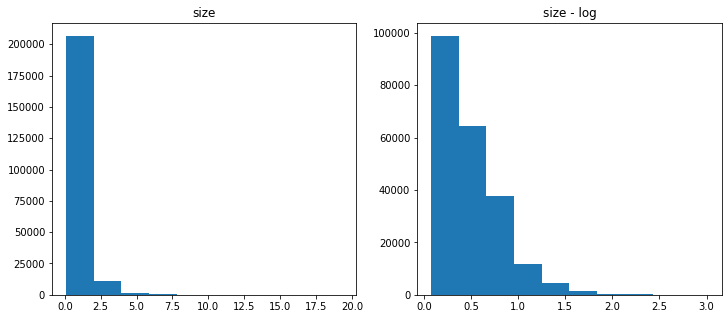

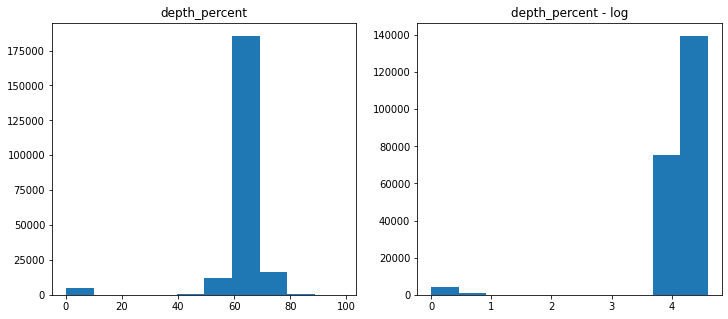

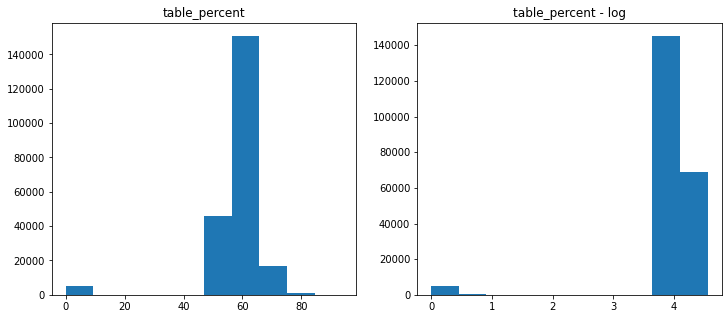

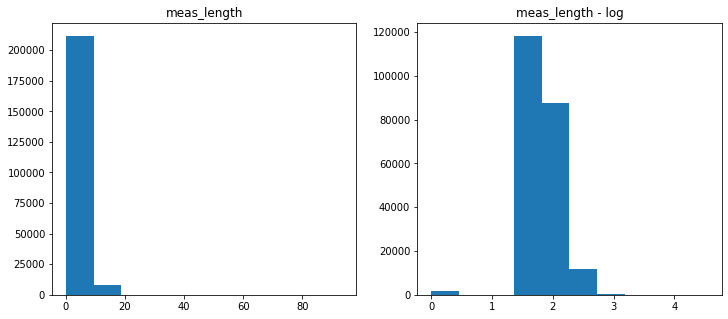

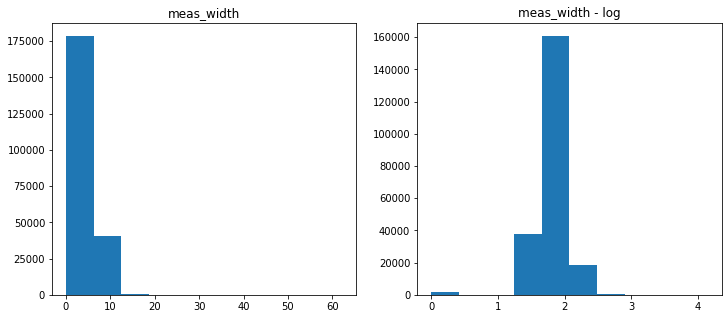

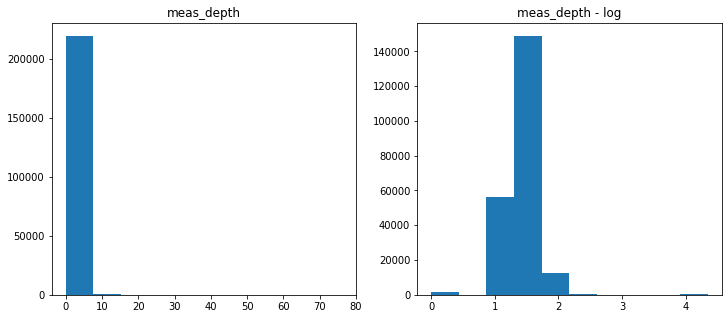

In [8]:
num_values = ['size', 'depth_percent', 'table_percent', 'meas_length', 'meas_width', 'meas_depth']

for col in num_values:
    fig, ax = plt.subplots(1, 2, figsize=(12, 5))
    ax.flat[0].hist(df[col])
    ax.flat[0].set_title(f'{col}')
    ax.flat[1].hist(np.log1p(df[col]))
    ax.flat[1].set_title(f'{col} - log')
    plt.show()

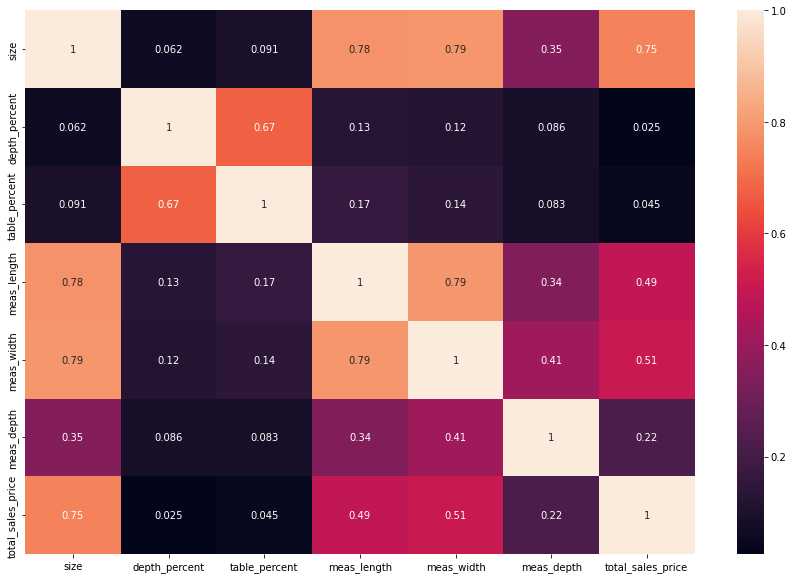

In [9]:
num_values_df = pd.DataFrame(df[num_values])
num_values_df['total_sales_price'] = (df['total_sales_price'])

plt.figure(figsize=(15, 10))
sns.heatmap(num_values_df.corr(), annot=True)
plt.show()

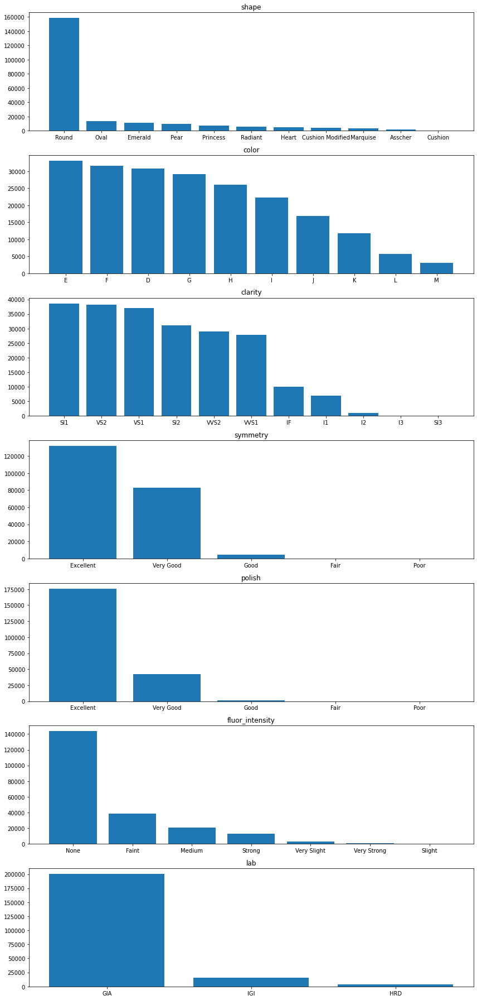

In [10]:
categ_values = ['shape', 'color', 'clarity', 'symmetry', 'polish', 'fluor_intensity', 'lab']

fig, ax = plt.subplots(nrows=7, ncols=1, figsize=(12, 25))

for i, col in enumerate(categ_values):
    ax[i].bar(
        df[col].value_counts().index,
        df[col].value_counts().values, 
    )
    ax[i].set_title(col)

plt.tight_layout()
plt.show()

## Preprocessing

In [79]:
def preprocess_inputs(df, scale=False):
  df = df.copy()

  df = df.drop(['diamond_id', 'date'], axis=1)
  df = df.drop(missing_value_cols, axis=1)

  df['size'] = np.log1p(df['size'])
  df['meas_length'] = np.log1p(df['meas_length'])
  df['meas_width'] = np.log1p(df['meas_width'])
  df['meas_depth'] = np.log1p(df['meas_depth'])

  df['symmetry'] = df['symmetry'].fillna(df['symmetry'].mode()[0])
  df['polish'] = df['polish'].fillna(df['polish'].mode()[0])

  dummies = pd.get_dummies(df[['shape', 'color', 'clarity', 'fluor_intensity', 'lab']])
  df = df.drop(['shape', 'color', 'clarity', 'fluor_intensity', 'lab'], axis=1)

  encoder = OrdinalEncoder(categories=[['Poor', 'Fair', 'Good', 'Very Good', 'Excellent']])
  df[['symmetry']] = encoder.fit_transform(df[['symmetry']])
  df[['polish']] = encoder.fit_transform(df[['polish']])

  result = pd.concat([df, dummies], axis=1)

  X = result.drop(['total_sales_price'], axis=1)
  y = np.log(result['total_sales_price'])

  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

  if scale: 
    scaler = StandardScaler()
    scaler.fit(X_train)
    X_train = pd.DataFrame(scaler.transform(X_train), index=X_train.index, columns=X_train.columns)
    X_test = pd.DataFrame(scaler.transform(X_test), index=X_test.index, columns=X_test.columns)
  
  return X_train, X_test, y_train, y_test

In [80]:
X_train, X_test, y_train, y_test = preprocess_inputs(df, scale=True)

In [81]:
X_train

,size,symmetry,polish,depth_percent,table_percent,meas_length,meas_width,meas_depth,shape_Asscher,shape_Cushion,shape_Cushion Modified,shape_Emerald,shape_Heart,shape_Marquise,shape_Oval,shape_Pear,shape_Princess,shape_Radiant,shape_Round,color_D,color_E,color_F,color_G,color_H,color_I,color_J,color_K,color_L,color_M,clarity_I1,clarity_I2,clarity_I3,clarity_IF,clarity_SI1,clarity_SI2,clarity_SI3,clarity_VS1,clarity_VS2,clarity_VVS1,clarity_VVS2,fluor_intensity_Faint,fluor_intensity_Medium,fluor_intensity_None,fluor_intensity_Slight,fluor_intensity_Strong,fluor_intensity_Very Slight,fluor_intensity_Very Strong,lab_GIA,lab_HRD,lab_IGI
211781,1.645049,0.782581,0.489981,0.041948,0.024874,1.146574,1.544358,1.432360,-0.088754,-0.048842,-0.136597,-0.231409,-0.148150,-0.116289,-0.259871,-0.217505,-0.180836,-0.163077,0.623863,-0.404618,-0.421082,-0.408039,2.552858,-0.36833,-0.336908,-0.288316,-0.236725,-0.163622,-0.118734,-0.181449,-0.0658,-0.021642,-0.218242,-0.461617,-0.406325,-0.005702,-0.450455,-0.456853,2.617889,-0.389617,-0.460394,-0.322544,0.730330,-0.006747,-0.254019,-0.112822,-0.070051,0.310584,-0.125321,-0.279612
145254,0.186322,-1.059310,0.489981,0.525486,-0.175807,1.846498,-0.381272,-0.189243,-0.088754,-0.048842,-0.136597,-0.231409,-0.148150,8.599266,-0.259871,-0.217505,-0.180836,-0.163077,-1.602915,-0.404618,-0.421082,-0.408039,-0.391718,-0.36833,2.968171,-0.288316,-0.236725,-0.163622,-0.118734,-0.181449,-0.0658,-0.021642,-0.218242,2.166296,-0.406325,-0.005702,-0.450455,-0.456853,-0.381987,-0.389617,2.172053,-0.322544,-1.369245,-0.006747,-0.254019,-0.112822,-0.070051,0.310584,-0.125321,-0.279612
148383,0.074624,-1.059310,0.489981,1.190351,0.426236,0.293234,-0.675368,-0.178433,-0.088754,-0.048842,-0.136597,-0.231409,-0.148150,-0.116289,-0.259871,-0.217505,-0.180836,6.132080,-1.602915,-0.404618,-0.421082,-0.408039,-0.391718,-0.36833,-0.336908,-0.288316,-0.236725,-0.163622,-0.118734,-0.181449,-0.0658,-0.021642,-0.218242,-0.461617,2.461086,-0.005702,-0.450455,-0.456853,-0.381987,-0.389617,2.172053,-0.322544,-1.369245,-0.006747,-0.254019,-0.112822,-0.070051,0.310584,-0.125321,-0.279612
120495,-0.285944,-1.059310,0.489981,1.059393,1.429642,-0.563689,-0.426316,0.011644,-0.088754,-0.048842,-0.136597,-0.231409,-0.148150,-0.116289,-0.259871,-0.217505,5.529870,-0.163077,-1.602915,-0.404618,-0.421082,2.450745,-0.391718,-0.36833,-0.336908,-0.288316,-0.236725,-0.163622,-0.118734,-0.181449,-0.0658,-0.021642,4.582076,-0.461617,-0.406325,-0.005702,-0.450455,-0.456853,-0.381987,-0.389617,-0.460394,-0.322544,0.730330,-0.006747,-0.254019,-0.112822,-0.070051,0.310584,-0.125321,-0.279612
30360,-0.307218,-1.059310,0.489981,-0.622916,0.927939,-0.368926,0.360450,-0.082343,-0.088754,-0.048842,-0.136597,-0.231409,6.749912,-0.116289,-0.259871,-0.217505,-0.180836,-0.163077,-1.602915,-0.404618,-0.421082,-0.408039,-0.391718,-0.36833,-0.336908,-0.288316,4.224305,-0.163622,-0.118734,-0.181449,-0.0658,-0.021642,-0.218242,2.166296,-0.406325,-0.005702,-0.450455,-0.456853,-0.381987,-0.389617,-0.460394,-0.322544,0.730330,-0.006747,-0.254019,-0.112822,-0.070051,0.310584,-0.125321,-0.279612
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150260,0.093513,-1.059310,0.489981,-6.213824,-5.794879,-6.656124,-7.260366,-6.114023,-0.088754,-0.048842,-0.136597,-0.231409,-0.148150,8.599266,-0.259871,-0.217505,-0.180836,-0.163077,-1.602915,-0.404618,-0.421082,2.450745,-0.391718,-0.36833,-0.336908,-0.288316,-0.236725,-0.163622,-0.118734,-0.181449,-0.0658,-0.021642,-0.218242,2.166296,-0.406325,-0.005702,-0.450455,-0.456853,-0.381987,-0.389617,-0.460394,-0.322544,0.730330,-0.006747,-0.254019,-0.112822,-0.070051,0.310584,-0.125321,-0.279612
113744,-0.307218,0.782581,0.489981,-0.048715,0.325896,-0.142350,0.097090,-0.029874,-0.088754,-0.048842,-0.136597,-0.231409,-0.148150,-0.116289,-0.259871,-0.217505,-0.180836,-0.163077,0.62

## Linear Regression

In [82]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [83]:
print(f'Intercept: {model.intercept_}')
print(f'Coefficients: {model.coef_}')

Intercept: 7.835329451258815
Coefficients: [ 1.05751737e+00 -9.12962350e-03  2.26401254e-02 -2.68085984e-02
 -2.65218349e-02  1.47824165e-02  7.04007555e-02  4.92060951e-02
 -6.29935784e+10 -3.48554772e+10 -9.59239274e+10 -1.57123197e+11
 -1.03702129e+11 -8.20766699e+10 -1.74137112e+11 -1.48562514e+11
 -1.25263609e+11 -1.13633969e+11 -3.21246020e+11 -1.37764938e-01
 -1.67232861e-01 -1.62266666e-01 -1.55843444e-01 -1.62314898e-01
 -1.85436384e-01 -2.04194166e-01 -2.10914828e-01 -1.71037288e-01
 -1.42245627e-01  1.55857563e+10  5.81291471e+09  1.91928690e+09
  1.84829888e+10  3.37622347e+10  3.09422787e+10  5.05886719e+08
  3.32246609e+10  3.35347287e+10  2.95759631e+10  3.00125340e+10
  5.58898006e-02  4.36771749e-02  7.72876236e-02 -2.71827214e-03
  3.14039542e-02  2.00944291e-02  5.27696734e-03 -7.49801413e+11
 -3.26600078e+11 -6.86474466e+11]


In [84]:
y_pred = model.predict(X_test)

In [101]:
print(f'MAE:  {mean_absolute_error(y_test, y_pred)}')
print(f'MSE:  {mean_squared_error(y_test, y_pred)}')
print(f'RMSE: {mean_squared_error(y_test, y_pred) ** 0.5}')

MAE:  0.2617060179810253
MSE:  0.14016250515678777
RMSE: 0.37438283234783587


In [103]:
print(f'R^2 score: {model.score(X_test, y_test)}')

R^2 score: 0.900263376060333


In [86]:
df.describe()

,diamond_id,size,depth_percent,table_percent,meas_length,meas_width,meas_depth,total_sales_price
count,2.197040e+05,219704.000000,219704.000000,219704.000000,219704.000000,219704.000000,219704.000000,2.197040e+05
mean,1.281166e+08,0.755176,61.683794,57.747579,5.548867,5.135623,3.285698,6.908035e+03
std,1.320737e+07,0.845892,9.915251,9.959906,1.763932,1.374527,2.054817,2.595944e+04
min,9.666855e+06,0.080000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000e+02
25%,1.275641e+08,0.310000,61.200000,57.000000,4.350000,4.310000,2.680000,9.580000e+02
50%,1.326076e+08,0.500000,62.400000,58.000000,5.060000,4.800000,3.030000,1.970000e+03
75%,1.348523e+08,1.000000,63.500000,60.000000,6.350000,5.700000,3.630000,5.207000e+03
max,1.361475e+08,19.350000,98.700000,94.000000,93.660000,62.300000,76.300000,1.449881e+06


[]

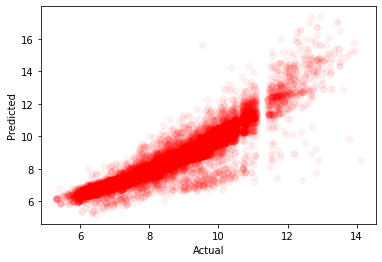

In [104]:
plt.scatter(y_test, y_pred, color='red', alpha=0.05)
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.plot()

In [105]:
y_test.describe()

count    65912.000000
mean         7.833293
std          1.185474
min          5.298317
25%          6.864848
50%          7.579934
75%          8.548062
max         14.115615
Name: total_sales_price, dtype: float64

In [106]:
pd.DataFrame(y_pred).describe()

,0
count,65912.000000
mean,7.832768
std,1.129378
min,5.232302
25%,7.059603
50%,7.459780
75%,8.328127
max,17.383852
